# IRIS SECTION 

In [4]:
import numpy as np
import importlib
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
import svm   
importlib.reload(svm)

iris = load_iris()
binary_mask = (iris.target == 0) | (iris.target == 1)

X = iris.data[binary_mask, :2]
y = iris.target[binary_mask] 

X, y = svm._check_X_y(X, y)


In [5]:
#for different experiments we will update the config 
config = svm.LinearSVMConfig(
    C=5000,          # 6 gives a wide margin, 13 gives a slightly smaller margin
    learning_rate=0.001, # Significantly increase learning rate
    n_epochs=5000,   # 500 is the sweet spot for 6
                  
    batch_size=32, ## Batch size changes the boundary line quite a lot
    verbose=True
)

clf = svm.LinearSVM(config=config)

print("\nStarting Training...")
clf.fit(X,y) 

print("\nTraining Complete.")
print(f"Final Weights (w): {clf.w}")
print(f"Final Bias (b): {clf.b:.4f}")


Starting Training...
[-698.31017062  716.50961096 -656.95956198  906.01255787  867.26186928
  969.81310288 -750.41107541  791.41106809  890.06242161 -738.36081923
  925.86257419  806.06124431  724.65998706 -600.95877711 -698.31017062
 -672.90969823 -637.10954565 -669.00981816 -761.16137157 -616.90891336
 -697.01021059  937.91283037 -643.60934577  867.26186928  844.8119329
  909.91243794 -639.7094657  -674.20965825  807.36120434  851.31173303
  860.4114532   824.61130062]
[-2959.51256871 -3103.10465062 -3281.31376482  3206.95574751
  3493.67409744 -2995.06122878 -2922.566467   -3101.24139509
  3277.58725376  2921.16902535 -3317.79405266  2812.19397574
  2528.27050911  3170.47545968  3706.96605783  3170.94127357
  3134.92679962  2741.09665561  3421.17933567 -3066.62436279
 -2888.41524859  3170.94127357  2956.71768541  3171.40708745
 -3138.1874968  -3748.57029837  3027.34919166  3028.28081943
  3099.84395344 -3677.00716436  3350.08201554  3243.43603534]
[ 843.84706175  593.0908121   711.


Plotting Decision Boundary...


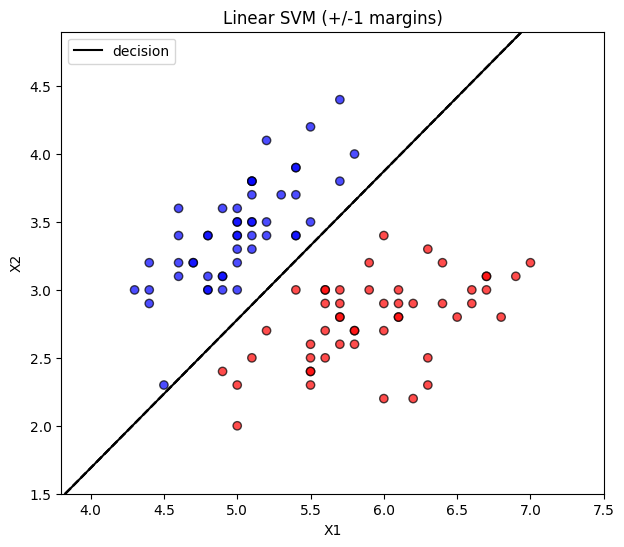

In [6]:
# Plot the results (requires matplotlib to be installed)
# We pass X and the original y_raw {0, 1} to the plot function for clear coloring
print("\nPlotting Decision Boundary...")
svm.plot_linear_svm_2d(clf, X, y)

# BLOB GRAPHS

In [7]:
### MAKE_BLOBS creates gaussian distribution with set hyperparameters for the standard deviation
from sklearn.datasets import make_blobs

X_blobs, y_blobs = make_blobs(
    n_samples=500,        
    n_features=2,         # Dimenstions
    centers=2,            # Number of centers/clusters to generate
                          # 0,1
    cluster_std=2.5,      
                          # We can maybe expirement with this. Maybe a range from (0.5  to 4) for
                          # seeing how well it does with varying seperability.  
    random_state=42       
)

print("Shape of X_blobs:", X_blobs.shape)
print("Shape of y_blobs:", y_blobs.shape)

X,y = svm._check_X_y(X_blobs,y_blobs)

Shape of X_blobs: (500, 2)
Shape of y_blobs: (500,)



Starting Training...
[16.51393178  6.22883981 15.86267931  8.19892457 -3.60454142 -3.7888675
 13.25949989 -2.02879668  0.82880682 17.89041847 15.90701815  1.49470831
 -3.16969382 16.95046078 -0.23103443 14.1443808  -1.74644498 16.15524014
 18.93484002 18.66082179 -3.82484415  2.85461635 10.34827408 18.76029191
 19.77722678 20.49049939 14.45457711  9.4906606  16.4855166   9.91223014
  0.85296187 12.67474745]
[ 3.77560912  3.09063188  6.99491075  7.61466758 10.18216678 18.60939019
 11.59856585 15.41264672  8.37946682  3.11150956 10.3410696   9.36128799
  1.57093224 11.72831702  8.62138252 16.6031887  16.96299157  3.48172788
 10.38903802  2.77810896  0.07100072 13.61210511 -1.43346668  0.53148709
 15.36104815  3.42343663  8.96226666  7.46499084 11.47373055 15.49391117
 11.889559   11.97595891]
[ 7.10449665 14.22369222  4.34301818  1.93910891  2.44373888 10.74093119
 11.66605298  5.85419814 15.15228113 12.64086781  8.98900934 -2.94544392
  4.90806063  7.43876516 -0.80514461  6.22897445 -2

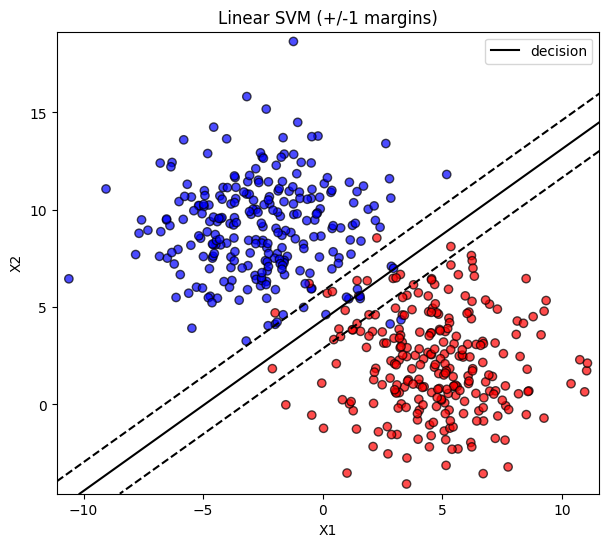

In [8]:
#for different experiments we will update the config 
config = svm.LinearSVMConfig(
    C=1,           
    learning_rate=0.01, 
    n_epochs=500,   # Increase the number of steps
    batch_size=32,
    verbose=True,
    random_state=10
)

clf = svm.LinearSVM(config=config)

print("\nStarting Training...")
clf.fit(X,y) 

print("\nTraining Complete.")
print(f"Final Weights (w): {clf.w}")
print(f"Final Bias (b): {clf.b:.4f}")
# Plot the results (requires matplotlib to be installed)
# We pass X and the original y_raw {0, 1} to the plot function for clear coloring
print("\nPlotting Decision Boundary...")
svm.plot_linear_svm_2d(clf, X, y)

## COMPARISON with scikit


The folowing section was partialy AI generated to help implement the comparison

[ 8.25622703  3.11932373  7.92838491  4.10221193 -1.80009405 -1.89201429
  6.62779324 -1.01143596  0.41715384  8.94292935  7.95361611  0.74935287
 -1.57958019  8.47342203 -0.11152457  7.07428471 -0.87097713  8.07560115
  9.4698475   9.32885091 -1.91093509  1.43240029  5.17956525  9.37965325
  9.88956111 10.2499598   7.2208013   4.73772808  8.24262808  4.9594536
  0.43130846  6.33227547]
[ 2.1004662   1.85246072  3.20081358  3.65340731  5.08973825  9.31340149
  5.78494638  7.68642779  4.39539478  1.83593459  5.43120524  4.59658634
  1.0656406   5.79230518  4.28625963  8.20736929  8.46833882  1.93522197
  5.50736051  1.65067768  0.35391201  6.67423888 -0.56974549  0.43955742
  7.65159314  1.86502301  4.3444131   3.90836142  6.10327131  7.67307489
  5.90183296  6.01759298]
[ 3.82829071  7.06238364  2.53101384  1.47514102  1.47937938  5.00801959
  5.33036251  3.30476273  7.47624564  5.95544929  5.0274207  -1.1405116
  2.74117441  3.82792851 -0.10803262  3.40602593 -1.13893405  3.84607773
 

/home/david/Desktop/FLOW_X13/EURECOM/MALIS/.venv/lib/python3.12/site-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


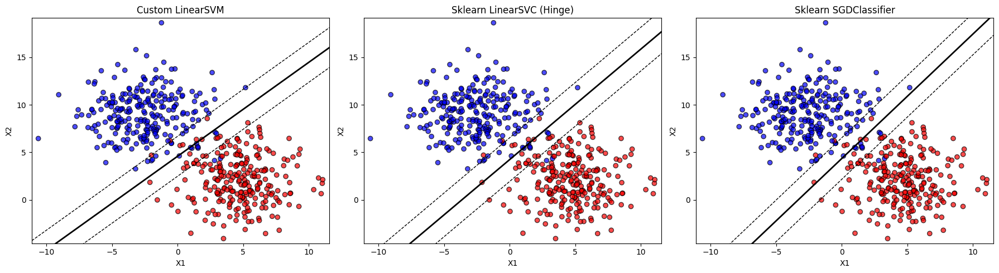

Model                     | Accuracy  
--------------------------------------
Custom LinearSVM          | 0.9680
LinearSVC (Hinge)         | 0.9720
SGDClassifier             | 0.9680


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import make_blobs
from sklearn.svm import LinearSVC
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import accuracy_score
from svm import _check_X_y, LinearSVMConfig, LinearSVM

# -------------------------------------------------------------------------
# 1. Data Generation (BLOB GRAPHS)
# -------------------------------------------------------------------------
X_blobs, y_blobs = make_blobs(
    n_samples=500,        
    n_features=2,         
    centers=2,            
    cluster_std=5.5,      
    random_state=42       
)

X, y = _check_X_y(X_blobs, y_blobs)

# -------------------------------------------------------------------------
# 2. Comparison Setup & Training
# -------------------------------------------------------------------------
# Configuration
# FIX: Removed 'svm.' prefix.
config = LinearSVMConfig(
    C=0.5,           
    learning_rate=0.01, 
    n_epochs=500,   
    batch_size=32,
    verbose=False,  
    random_state=10
)

# A) Train Custom SVM
clf_custom = LinearSVM(config=config)
clf_custom.fit(X, y)

# B) Train LinearSVC (Hinge)
clf_lsvc = LinearSVC(
    loss='hinge', 
    C=config.C, 
    max_iter=config.n_epochs, 
    random_state=config.random_state,
    dual="auto"
)
clf_lsvc.fit(X, y)

# C) Train SGDClassifier
# Match hyperparameters: alpha = 1 / (N * C)
n_samples = X.shape[0]
alpha_sgd = 1.0 / (n_samples * config.C)

clf_sgdc = SGDClassifier(
    loss='hinge',
    penalty='l2',
    alpha=alpha_sgd,
    fit_intercept=True,
    learning_rate='constant',
    eta0=config.learning_rate,
    max_iter=config.n_epochs,
    random_state=config.random_state,
    shuffle=True
)
clf_sgdc.fit(X, y)

# -------------------------------------------------------------------------
# 3. Plotting Side-by-Side
# -------------------------------------------------------------------------
def plot_svm_on_ax(ax, w, b, X, y, title):
    """Helper to plot SVM decision boundary on a specific matplotlib axis."""
    ax.scatter(X[:,0], X[:,1], c=y, cmap='bwr', edgecolor='k', alpha=0.7)
    
    # Determine plot limits
    x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
    y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    # Plot lines: w0*x + w1*y + b = 0  => y = -(w0*x + b) / w1
    if abs(w[1]) > 1e-12:
        x_plot = np.linspace(x_min, x_max, 100)
        
        # Decision Boundary
        y_decision = -(w[0] * x_plot + b) / w[1]
        ax.plot(x_plot, y_decision, 'k-', linewidth=2, label='Decision')
        
        # Margins (decision value = +/- 1)
        y_up = -(w[0] * x_plot + b - 1) / w[1]
        y_down = -(w[0] * x_plot + b + 1) / w[1]
        ax.plot(x_plot, y_up, 'k--', linewidth=1)
        ax.plot(x_plot, y_down, 'k--', linewidth=1)
    
    ax.set_title(title)
    ax.set_xlabel("X1")
    ax.set_ylabel("X2")

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot 1: Custom SVM
plot_svm_on_ax(axes[0], clf_custom.w, clf_custom.b, X, y, "Custom LinearSVM")

# Plot 2: LinearSVC
w_lsvc = clf_lsvc.coef_[0]
b_lsvc = clf_lsvc.intercept_[0]
plot_svm_on_ax(axes[1], w_lsvc, b_lsvc, X, y, "Sklearn LinearSVC (Hinge)")

# Plot 3: SGDClassifier
w_sgdc = clf_sgdc.coef_[0]
b_sgdc = clf_sgdc.intercept_[0]
plot_svm_on_ax(axes[2], w_sgdc, b_sgdc, X, y, "Sklearn SGDClassifier")

plt.tight_layout()
plt.show()

# -------------------------------------------------------------------------
# 4. Accuracy Comparison
# -------------------------------------------------------------------------
acc_custom = clf_custom.score(X, y)
acc_lsvc = accuracy_score(y, clf_lsvc.predict(X))
acc_sgdc = accuracy_score(y, clf_sgdc.predict(X))

print(f"{'Model':<25} | {'Accuracy':<10}")
print("-" * 38)
print(f"{'Custom LinearSVM':<25} | {acc_custom:.4f}")
print(f"{'LinearSVC (Hinge)':<25} | {acc_lsvc:.4f}")
print(f"{'SGDClassifier':<25} | {acc_sgdc:.4f}")